In [1]:
!pip install gdown
!pip install shap
import gdown
import pandas as pd

In [2]:
!gdown https://drive.google.com/uc?id=1Tksi8UyzW-drFWd7maGr7MoHVa-VHQCO

Downloading...
From: https://drive.google.com/uc?id=1Tksi8UyzW-drFWd7maGr7MoHVa-VHQCO
To: /kaggle/working/OLIDv1.0.zip
100%|█████████████████████████████████████████| 875k/875k [00:00<00:00, 107MB/s]


In [3]:
!pwd

/kaggle/working


In [4]:
!mkdir OLIDv1
!unzip OLIDv1.0.zip -d OLIDv1

Archive:  OLIDv1.0.zip
  inflating: OLIDv1/olid-annotation.txt  
  inflating: OLIDv1/olid-training-v1.0.tsv  
  inflating: OLIDv1/README.txt       
  inflating: OLIDv1/labels-levela.csv  
  inflating: OLIDv1/labels-levelb.csv  
  inflating: OLIDv1/labels-levelc.csv  
  inflating: OLIDv1/testset-levelc.tsv  
  inflating: OLIDv1/testset-levelb.tsv  
  inflating: OLIDv1/testset-levela.tsv  


In [5]:
training_data = pd.read_csv('OLIDv1/olid-training-v1.0.tsv', sep='\t')
text_test = pd.read_csv('OLIDv1/testset-levela.tsv', sep='\t')
label_test = pd.read_csv('OLIDv1/labels-levela.csv', sep=',', header=None)
test_data = pd.merge(text_test, label_test, left_on='id', right_on=0)

In [6]:
training_data.head()

,id,tweet,subtask_a,subtask_b,subtask_c
0,86426,@USER She should ask a few native Americans wh...,OFF,UNT,NaN
1,90194,@USER @USER Go home you’re drunk!!! @USER #MAG...,OFF,TIN,IND
2,16820,Amazon is investigating Chinese employees who ...,NOT,NaN,NaN
3,62688,"@USER Someone should'veTaken"" this piece of sh...",OFF,UNT,NaN
4,43605,@USER @USER Obama wanted liberals &amp; illega...,NOT,NaN,NaN


In [7]:
test_data.head()

,id,tweet,0,1
0,15923,#WhoIsQ #WheresTheServer #DumpNike #DECLASFISA...,15923,OFF
1,27014,"#ConstitutionDay is revered by Conservatives, ...",27014,NOT
2,30530,#FOXNews #NRA #MAGA #POTUS #TRUMP #2ndAmendmen...,30530,NOT
3,13876,#Watching #Boomer getting the news that she is...,13876,NOT
4,60133,#NoPasaran: Unity demo to oppose the far-right...,60133,OFF


In [8]:
text_train = training_data['tweet'].tolist()
label_train = training_data['subtask_a'].tolist()
label_train_encoded = training_data['subtask_a'].map({'OFF': 1, 'NOT': 0}).tolist()
label_values = training_data['subtask_a'].unique().tolist()

text_test = test_data['tweet'].tolist()
label_test = test_data[1].tolist()
label_test_encoded = test_data[1].map({'OFF': 1, 'NOT': 0}).tolist()

In [9]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf = TfidfVectorizer(stop_words='english', max_df=0.7)
tfidf.fit(text_train)
text_train_tfidf = tfidf.transform(text_train).toarray()

In [10]:
text_test_tfidf = tfidf.transform(text_test).toarray()

## Logistic Regression, Naive Bayes, Linear SVM

In [11]:
from sklearn.linear_model import LogisticRegression

logreg = LogisticRegression()

In [12]:
from sklearn.model_selection import cross_validate

cv_results_lr = cross_validate(logreg, text_train_tfidf, label_train_encoded, cv=10, scoring=['f1_micro', 'f1_macro', 'precision', 'recall', 'accuracy'])

print('F1 Micro:  Mean=', cv_results_lr['test_f1_micro'].mean(),", Std=", cv_results_lr['test_f1_micro'].std())
print('F1 Macro:  Mean=', cv_results_lr['test_f1_macro'].mean(),", Std=", cv_results_lr['test_f1_macro'].std())
print('Precision: Mean=', cv_results_lr['test_precision'].mean(),", Std=", cv_results_lr['test_precision'].std())
print('Recall:    Mean=', cv_results_lr['test_recall'].mean(),", Std=", cv_results_lr['test_recall'].std())
print('Accuracy:  Mean=', cv_results_lr['test_accuracy'].mean(),", Std=", cv_results_lr['test_accuracy'].std())

F1 Micro:  Mean= 0.7582326283987916 , Std= 0.0077205702586408236
F1 Macro:  Mean= 0.668279950520338 , Std= 0.013071256701236635
Precision: Mean= 0.8073800118377565 , Std= 0.018169449461810677
Recall:    Mean= 0.3577272727272727 , Std= 0.020484826071352272
Accuracy:  Mean= 0.7582326283987916 , Std= 0.007720570258640842


In [13]:
from sklearn.metrics import classification_report

logreg.fit(text_train_tfidf, label_train_encoded)
label_pred_lr = logreg.predict(text_test_tfidf)

print(classification_report(label_test_encoded, label_pred_lr))

              precision    recall  f1-score   support

           0       0.79      0.98      0.88       620
           1       0.87      0.33      0.48       240

    accuracy                           0.80       860
   macro avg       0.83      0.66      0.68       860
weighted avg       0.81      0.80      0.77       860



In [14]:
from sklearn.naive_bayes import MultinomialNB

nb = MultinomialNB()

In [15]:
cv_results_nb = cross_validate(nb, text_train_tfidf, label_train_encoded, cv=10, scoring=['f1_micro', 'f1_macro', 'precision', 'recall', 'accuracy'])

print('F1 Micro:  Mean=', cv_results_nb['test_f1_micro'].mean(),", Std=", cv_results_nb['test_f1_micro'].std())
print('F1 Macro:  Mean=', cv_results_nb['test_f1_macro'].mean(),", Std=", cv_results_nb['test_f1_macro'].std())
print('Precision: Mean=', cv_results_nb['test_precision'].mean(),", Std=", cv_results_nb['test_precision'].std())
print('Recall:    Mean=', cv_results_nb['test_recall'].mean(),", Std=", cv_results_nb['test_recall'].std())
print('Accuracy:  Mean=', cv_results_nb['test_accuracy'].mean(),", Std=", cv_results_nb['test_accuracy'].std())

F1 Micro:  Mean= 0.7222054380664653 , Std= 0.004604154276171632
F1 Macro:  Mean= 0.575871192895814 , Std= 0.01146621340948773
Precision: Mean= 0.8398777985310728 , Std= 0.02602459448515722
Recall:    Mean= 0.20318181818181819 , Std= 0.01661424262045188
Accuracy:  Mean= 0.7222054380664652 , Std= 0.004604154276171666


In [16]:
nb.fit(text_train_tfidf, label_train_encoded)
label_pred_nb = nb.predict(text_test_tfidf)
print(classification_report(label_test_encoded, label_pred_nb))

              precision    recall  f1-score   support

           0       0.76      1.00      0.86       620
           1       0.93      0.17      0.29       240

    accuracy                           0.77       860
   macro avg       0.85      0.59      0.58       860
weighted avg       0.81      0.77      0.70       860



In [17]:
from sklearn.svm import LinearSVC

svm = LinearSVC()

In [19]:
cv_results_svm = cross_validate(svm, text_train_tfidf, label_train_encoded, cv=10, scoring=['f1_micro', 'f1_macro', 'precision', 'recall', 'accuracy'])

print('F1 Micro:  Mean=', cv_results_svm['test_f1_micro'].mean(),", Std=", cv_results_svm['test_f1_micro'].std())
print('F1 Macro:  Mean=', cv_results_svm['test_f1_macro'].mean(),", Std=", cv_results_svm['test_f1_macro'].std())
print('Precision: Mean=', cv_results_svm['test_precision'].mean(),", Std=", cv_results_svm['test_precision'].std())
print('Recall:    Mean=', cv_results_svm['test_recall'].mean(),", Std=", cv_results_svm['test_recall'].std())
print('Accuracy:  Mean=', cv_results_svm['test_accuracy'].mean(),", Std=", cv_results_svm['test_accuracy'].std())

F1 Micro:  Mean= 0.7605740181268883 , Std= 0.010498217736491866
F1 Macro:  Mean= 0.7080623632474952 , Std= 0.012948682049951237
Precision: Mean= 0.6907787291241312 , Std= 0.022107021218163336
Recall:    Mean= 0.5063636363636363 , Std= 0.018625273862316244
Accuracy:  Mean= 0.7605740181268883 , Std= 0.010498217736491861


In [20]:
svm.fit(text_train_tfidf, label_train_encoded)
label_pred_svm = svm.predict(text_test_tfidf)
print(classification_report(label_test_encoded, label_pred_svm))

              precision    recall  f1-score   support

           0       0.82      0.93      0.87       620
           1       0.71      0.47      0.57       240

    accuracy                           0.80       860
   macro avg       0.76      0.70      0.72       860
weighted avg       0.79      0.80      0.78       860



In [21]:
import shap

explainer = shap.Explainer(
    logreg, text_train_tfidf, feature_names=tfidf.get_feature_names_out()
)
shap_values = explainer(text_train_tfidf)

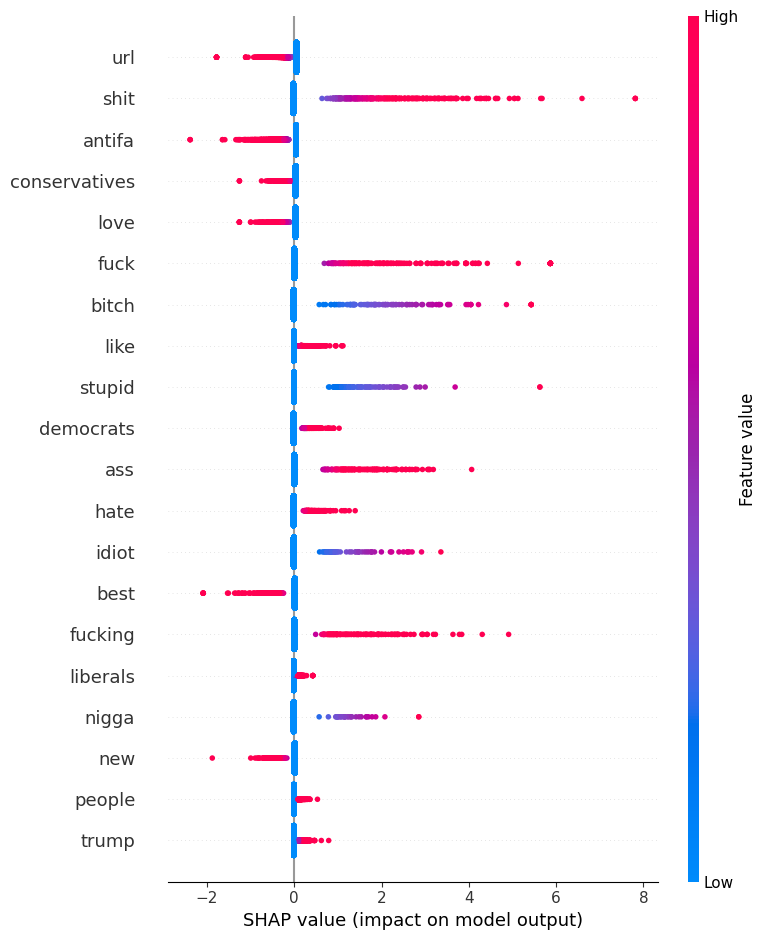

In [22]:
shap.summary_plot(shap_values, text_train_tfidf, feature_names=tfidf.get_feature_names_out())

In [26]:
import matplotlib

id_to_label = {0: 'NOT', 1: 'OFF'}
train_label_pred = logreg.predict(text_train_tfidf)


Text: @USER @USER Ppl who say I'm not racist" are racist. You Are A Racist. Repeat after me"
True Label: NOT
Predicted Label: OFF


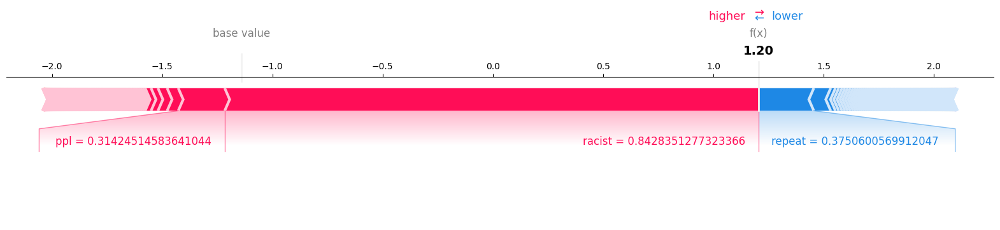

In [31]:
wrong_pred_indices = [i for i in range(len(label_train_encoded)) if label_train_encoded[i] != train_label_pred[i]]
wrong_pred_indices = wrong_pred_indices[:20]
ind = wrong_pred_indices[10]
print('Text:', text_train[ind])
print('True Label:', label_train[ind])
print('Predicted Label:', id_to_label[train_label_pred[ind]])
shap.plots.force(shap_values[ind],matplotlib=True)


Text: @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER I like my soda like I like my boarders with a lot of ICE.
True Label: NOT
Predicted Label: NOT


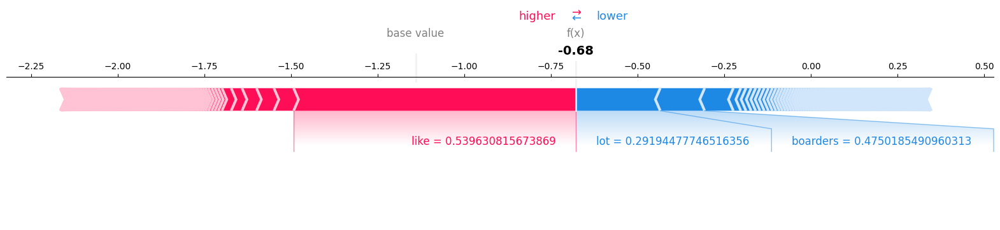

In [32]:
true_pred_indices = [i for i in range(len(label_train_encoded)) if label_train_encoded[i] == train_label_pred[i]]
true_pred_indices = true_pred_indices[:20]
ind = true_pred_indices[10]
print('Text:', text_train[ind])
print('True Label:', label_train[ind])
print('Predicted Label:', id_to_label[train_label_pred[ind]])
shap.plots.force(shap_values[ind],matplotlib=True)

## Model based on Transformers

In [33]:
import torch
from transformers import BertTokenizer, BertForSequenceClassification


In [34]:
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

tokenizer_config.json:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

In [35]:
from sklearn.model_selection import train_test_split

text_train, text_val, label_train_encoded, label_val_encoded = train_test_split(text_train, label_train_encoded, test_size=0.1, random_state=42)

In [36]:
text_lengs = [len(text.split()) for text in text_train]
print('Max length:', max(text_lengs))
print('Min length:', min(text_lengs))


Max length: 103
Min length: 2


In [37]:
print('Original Text: ', text_train[0], '\n')
print('Tokenized Text: ', tokenizer.tokenize(text_train[0]), '\n')
print('Token IDs: ', tokenizer.convert_tokens_to_ids(tokenizer.tokenize(text_train[0])))

Original Text:  #WashingtonPost broke the story therapist notes Miss Ford stated four men assaulted her 😠 now it's two😮 #VoteDemsOut to end #DirtyTricks stop what's wrong with #DC #Kavanaugh #maga #FoxNews #Liar #CNN #msnbc #SenFlake #Wrong to use #MeToo for politics  #ChristineBlaseyFord URL 

Tokenized Text:  ['#', 'washington', '##post', 'broke', 'the', 'story', 'therapist', 'notes', 'miss', 'ford', 'stated', 'four', 'men', 'assaulted', 'her', '[UNK]', 'now', 'it', "'", 's', '[UNK]', '#', 'voted', '##em', '##so', '##ut', 'to', 'end', '#', 'dirty', '##trick', '##s', 'stop', 'what', "'", 's', 'wrong', 'with', '#', 'dc', '#', 'ka', '##vana', '##ugh', '#', 'mag', '##a', '#', 'fox', '##ne', '##ws', '#', 'liar', '#', 'cnn', '#', 'ms', '##nbc', '#', 'sen', '##fl', '##ake', '#', 'wrong', 'to', 'use', '#', 'met', '##oo', 'for', 'politics', '#', 'christine', '##bla', '##sey', '##ford', 'ur', '##l'] 

Token IDs:  [1001, 2899, 19894, 3631, 1996, 2466, 19294, 3964, 3335, 4811, 3090, 2176, 2273, 

In [38]:
text_train_encoded = [tokenizer.encode(text, padding='max_length', max_length=200) for text in text_train]

In [39]:
text_ids_lengths = [len(text_train_encoded[i]) for i in range(len(text_train_encoded))]
print('Max length:', max(text_ids_lengths))
print('Min length:', min(text_ids_lengths))

Max length: 200
Min length: 200


In [40]:
text_val_encoded = [tokenizer.encode(text, padding='max_length', max_length=200) for text in text_val]

In [41]:
text_ids_lengths = [len(text_val_encoded[i]) for i in range(len(text_val_encoded))]
print('Max length:', max(text_ids_lengths))
print('Min length:', min(text_ids_lengths))

Max length: 200
Min length: 200


In [42]:
text_test_encoded = [tokenizer.encode(text, padding='max_length', max_length=200) for text in text_test]

In [43]:
text_ids_lengths = [len(text_test_encoded[i]) for i in range(len(text_test_encoded))]
print('Max length:', max(text_ids_lengths))
print('Min length:', min(text_ids_lengths))

Max length: 200
Min length: 200


In [44]:
text_train_masks = [[float(i > 0) for i in text] for text in text_train_encoded]
text_val_masks = [[float(i > 0) for i in text] for text in text_val_encoded]
text_test_masks = [[float(i > 0) for i in text] for text in text_test_encoded]

In [45]:
train_x, train_y, train_m = text_train_encoded, label_train_encoded, text_train_masks
val_x, val_y, val_m = text_val_encoded, label_val_encoded, text_val_masks
test_x, test_y, test_m = text_test_encoded, label_test_encoded, text_test_masks

In [46]:
train_x = torch.tensor(train_x)
test_x = torch.tensor(test_x)
val_x = torch.tensor(val_x)
train_y = torch.tensor(train_y)
test_y = torch.tensor(test_y)
val_y = torch.tensor(val_y)
train_m = torch.tensor(train_m)
test_m = torch.tensor(test_m)
val_m = torch.tensor(val_m)

print(train_x.shape)
print(test_x.shape)
print(val_x.shape)
print(train_y.shape)
print(test_y.shape)
print(val_y.shape)
print(train_m.shape)
print(test_m.shape)
print(val_m.shape)

torch.Size([11916, 200])
torch.Size([860, 200])
torch.Size([1324, 200])
torch.Size([11916])
torch.Size([860])
torch.Size([1324])
torch.Size([11916, 200])
torch.Size([860, 200])
torch.Size([1324, 200])


In [47]:
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler

batch_size = 32

train_data = TensorDataset(train_x, train_m, train_y)
train_sampler = RandomSampler(train_data)
train_dataloader = DataLoader(train_data, sampler=train_sampler, batch_size=batch_size)

val_data = TensorDataset(val_x, val_m, val_y)
val_sampler = SequentialSampler(val_data)
val_dataloader = DataLoader(val_data, sampler=val_sampler, batch_size=batch_size)

In [48]:
model = BertForSequenceClassification.from_pretrained('bert-base-uncased', num_labels=2,
                                                      output_attentions=False, output_hidden_states=False)

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [49]:
device = torch.device("cuda")
print(device)

model = model.to(device)

cuda


In [50]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

print('Number of trainable parameters:', count_parameters(model), '\n', model)

Number of trainable parameters: 109483778 
 BertForSequenceClassification(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
           

In [51]:
[n for n, p in model.named_parameters()]


['bert.embeddings.word_embeddings.weight',
 'bert.embeddings.position_embeddings.weight',
 'bert.embeddings.token_type_embeddings.weight',
 'bert.embeddings.LayerNorm.weight',
 'bert.embeddings.LayerNorm.bias',
 'bert.encoder.layer.0.attention.self.query.weight',
 'bert.encoder.layer.0.attention.self.query.bias',
 'bert.encoder.layer.0.attention.self.key.weight',
 'bert.encoder.layer.0.attention.self.key.bias',
 'bert.encoder.layer.0.attention.self.value.weight',
 'bert.encoder.layer.0.attention.self.value.bias',
 'bert.encoder.layer.0.attention.output.dense.weight',
 'bert.encoder.layer.0.attention.output.dense.bias',
 'bert.encoder.layer.0.attention.output.LayerNorm.weight',
 'bert.encoder.layer.0.attention.output.LayerNorm.bias',
 'bert.encoder.layer.0.intermediate.dense.weight',
 'bert.encoder.layer.0.intermediate.dense.bias',
 'bert.encoder.layer.0.output.dense.weight',
 'bert.encoder.layer.0.output.dense.bias',
 'bert.encoder.layer.0.output.LayerNorm.weight',
 'bert.encoder.layer

In [52]:
from torch.optim import AdamW
learning_rate = 1e-5
eps_opt=1e-8


optimizer = AdamW(model.parameters(), lr=learning_rate, eps=eps_opt)

In [53]:
from transformers import get_linear_schedule_with_warmup

num_epochs = 4
total_steps = len(train_dataloader) * num_epochs

scheduler = get_linear_schedule_with_warmup(optimizer, num_warmup_steps=0, num_training_steps=total_steps)

In [54]:
import time

def epoch_time(start_time, end_time):
    elapsed_time = end_time - start_time
    elapsed_mins = int(elapsed_time / 60)
    elapsed_secs = int(elapsed_time - (elapsed_mins * 60))
    return elapsed_mins, elapsed_secs

In [55]:
from tqdm.notebook import tqdm
import numpy as np

train_losses = []
val_losses = []
num_mb_train = len(train_dataloader)
num_mb_val = len(val_dataloader)

if num_mb_val == 0:
    num_mb_val = 1

best_model = model
best_loss = np.inf
for n in range(num_epochs):
    train_loss = 0
    val_loss = 0
    start_time = time.time()

    for k, (mb_x, mb_m, mb_y) in tqdm(enumerate(train_dataloader), total=num_mb_train):
        optimizer.zero_grad()
        model.train()

        mb_x = mb_x.to(device)
        mb_m = mb_m.to(device)
        mb_y = mb_y.to(device)

        outputs = model(mb_x, attention_mask=mb_m, labels=mb_y)

        loss = outputs.loss
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()
        scheduler.step()

        train_loss += loss.data / num_mb_train

    print ("\nTrain loss after itaration %i: %f" % (n+1, train_loss))
    train_losses.append(train_loss.cpu())


    with torch.no_grad():
        model.eval()

        for k, (mb_x, mb_m, mb_y) in tqdm(enumerate(val_dataloader), total=num_mb_val):
            mb_x = mb_x.to(device)
            mb_m = mb_m.to(device)
            mb_y = mb_y.to(device)

            outputs = model(mb_x, attention_mask=mb_m, labels=mb_y)

            loss = outputs.loss
            #loss = model_loss(outputs[1], mb_y)

            val_loss += loss.data / num_mb_val
        if val_loss < best_loss:
            best_model = model
            best_loss = val_loss
        print ("Validation loss after itaration %i: %f" % (n+1, val_loss))
        val_losses.append(val_loss.cpu())

    end_time = time.time()
    epoch_mins, epoch_secs = epoch_time(start_time, end_time)
    print(f'Time: {epoch_mins}m {epoch_secs}s')

  0%|          | 0/373 [00:00<?, ?it/s]


Train loss after itaration 1: 0.500601


  0%|          | 0/42 [00:00<?, ?it/s]

Validation loss after itaration 1: 0.430990
Time: 3m 44s


  0%|          | 0/373 [00:00<?, ?it/s]


Train loss after itaration 2: 0.394699


  0%|          | 0/42 [00:00<?, ?it/s]

Validation loss after itaration 2: 0.430794
Time: 3m 42s


  0%|          | 0/373 [00:00<?, ?it/s]


Train loss after itaration 3: 0.345567


  0%|          | 0/42 [00:00<?, ?it/s]

Validation loss after itaration 3: 0.434554
Time: 3m 43s


  0%|          | 0/373 [00:00<?, ?it/s]


Train loss after itaration 4: 0.305722


  0%|          | 0/42 [00:00<?, ?it/s]

Validation loss after itaration 4: 0.444104
Time: 3m 43s


In [73]:
import pickle
import os

out_dir = './model'

if not os.path.exists(out_dir):
    os.makedirs(out_dir)

model_to_save = best_model.module if hasattr(best_model, 'module') else best_model
model_to_save.save_pretrained(out_dir)
tokenizer.save_pretrained(out_dir)

with open(out_dir + '/train_losses.pkl', 'wb') as f:
    pickle.dump(train_losses, f)

with open(out_dir + '/val_losses.pkl', 'wb') as f:
    pickle.dump(val_losses, f)

In [57]:
out_dir = './model'

loaded_model = BertForSequenceClassification.from_pretrained(out_dir)

device = torch.device("cuda")
loaded_model = loaded_model.to(device)

with open(out_dir + '/train_losses.pkl', 'rb') as f:
    train_losses = pickle.load(f)

with open(out_dir + '/val_losses.pkl', 'rb') as f:
    val_losses = pickle.load(f)

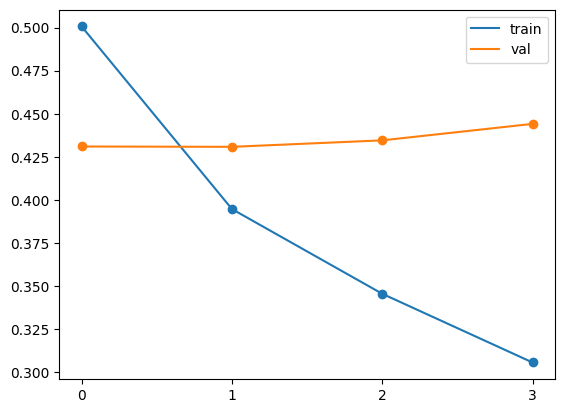

In [58]:
from matplotlib import pyplot as plt
%matplotlib inline

plt.figure()
plt.plot(train_losses)
plt.plot(val_losses)
plt.legend(['train', 'val'])
plt.scatter(range(len(train_losses)), train_losses)
plt.scatter(range(len(val_losses)), val_losses)
plt.xticks(np.arange(0, len(train_losses), 1))
plt.show()

In [59]:
batch_size = 32

test_data = TensorDataset(test_x, test_m)
test_sampler = SequentialSampler(test_data)
test_dataloader = DataLoader(test_data, sampler=test_sampler, batch_size=batch_size)

outputs = []
with torch.no_grad():
    loaded_model.eval()
    for k, (mb_x, mb_m) in enumerate(test_dataloader):
        mb_x = mb_x.to(device)
        mb_m = mb_m.to(device)
        output = loaded_model(mb_x, attention_mask=mb_m)
        outputs.append(output.logits.to('cpu'))

outputs = torch.cat(outputs)

In [60]:
predicted_labels = torch.argmax(outputs, dim=1)
predicted_values = predicted_labels.numpy()
true_values = test_y.numpy()

In [61]:
test_accuracy = np.sum(predicted_values == true_values) / len(true_values)
print ("Test Accuracy:", test_accuracy)

Test Accuracy: 0.8593023255813953


In [62]:
from sklearn.metrics import classification_report

print(classification_report(true_values, predicted_values, target_names=[str(l) for l in label_values]))

              precision    recall  f1-score   support

         OFF       0.88      0.93      0.90       620
         NOT       0.78      0.68      0.73       240

    accuracy                           0.86       860
   macro avg       0.83      0.81      0.82       860
weighted avg       0.86      0.86      0.86       860



In [63]:
import itertools

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

Confusion matrix, without normalization
[[575  45]
 [ 76 164]]
Normalized confusion matrix
[[0.93 0.07]
 [0.32 0.68]]


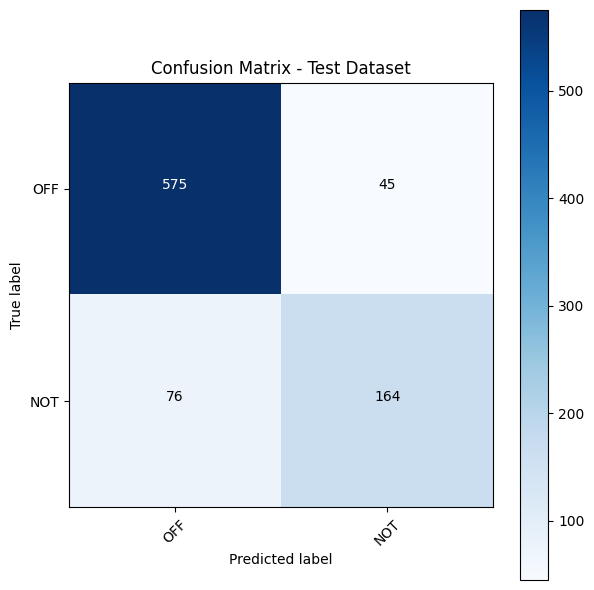

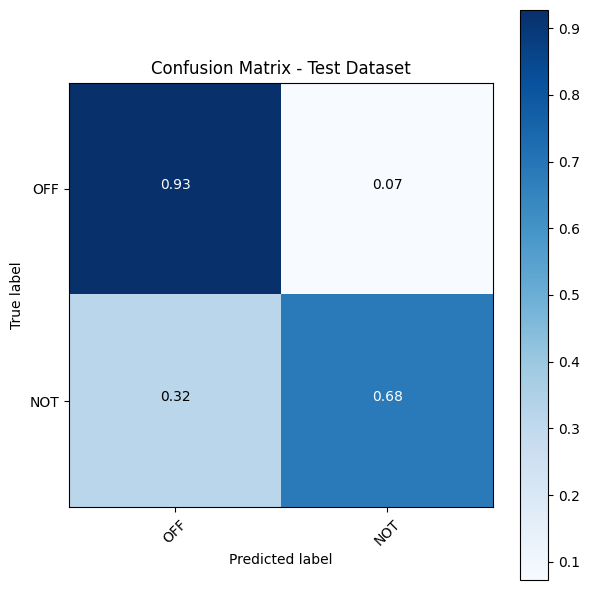

In [64]:
from sklearn.metrics import classification_report, confusion_matrix
cm_test = confusion_matrix(true_values, predicted_values)

np.set_printoptions(precision=2)

plt.figure(figsize=(6,6))
plot_confusion_matrix(cm_test, classes=label_values, title='Confusion Matrix - Test Dataset')
plt.figure(figsize=(6,6))
plot_confusion_matrix(cm_test, classes=label_values, title='Confusion Matrix - Test Dataset', normalize=True)

In [65]:
outputs_val = []
with torch.no_grad():
    loaded_model.eval()
    for k, (mb_x, mb_m, mb_y) in tqdm(enumerate(val_dataloader), total=num_mb_val):
        mb_x = mb_x.to(device)
        mb_m = mb_m.to(device)
        mb_y = mb_y.to(device)
        output = loaded_model(mb_x, attention_mask=mb_m)
        outputs_val.append((mb_y.to('cpu'), torch.argmax(output.logits, dim=1).to('cpu')))

true_values_val = []
predicted_values_val = []
for i in range(len(outputs_val)):
    true_values_val.extend(outputs_val[i][0].numpy())
    predicted_values_val.extend(outputs_val[i][1].numpy())

  0%|          | 0/42 [00:00<?, ?it/s]

In [66]:
import shap

In [67]:
from transformers import TextClassificationPipeline

pipe = TextClassificationPipeline(model=loaded_model, tokenizer=tokenizer, return_all_scores=True)

2024-02-03 16:13:15.344729: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-03 16:13:15.344902: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-03 16:13:15.497405: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
`return_all_scores` is now deprecated,  if want a similar functionality use `top_k=None` instead of `return_all_scores=True` or `top_k=1` instead of `return_all_scores=False`.


In [68]:
def score_and_visualize(text):
    prediction = pipe([text])
    print(prediction[0])
    explainer = shap.Explainer(pipe, output_names=['NOT','OFF'])
    shap_values = explainer([text])
    shap.plots.text(shap_values)

In [69]:
score_and_visualize('Are you fucking kidding me?!')

[{'label': 'LABEL_0', 'score': 0.035702794790267944}, {'label': 'LABEL_1', 'score': 0.9642971754074097}]


In [70]:
# find val ids that are misclassified
misclassified_val_ids = [i for i in range(len(true_values_val)) if true_values_val[i] != predicted_values_val[i]]
true_classified_val_ids = [i for i in range(len(true_values_val)) if true_values_val[i] == predicted_values_val[i]]


In [71]:
limit = 20

id_to_label = {0: "NOT", 1: "OFF"}
for ind in misclassified_val_ids[:limit]:
    print('Text:', text_val[ind])
    print('True Label:', id_to_label[true_values_val[ind]])
    print('Predicted Label:', id_to_label[predicted_values_val[ind]])
    score_and_visualize(text_val[ind])
    print('****************************************************************')
    

Text: @USER @USER Why is John Kerry running his mouth again as if we cared about what he has to say?  I can’t think of a single damn thing Kerry has accomplished besides run his mouth. Trump’s accomplishments exceed anything Kerry could ever dream of. Even before becoming president!
True Label: NOT
Predicted Label: OFF
[{'label': 'LABEL_0', 'score': 0.4267347455024719}, {'label': 'LABEL_1', 'score': 0.5732652544975281}]


  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:58, 58.31s/it]               


****************************************************************
Text: #prouduncle 😍 she is the finest cheerleader of them all💙 te amo stinky butt💝 URL
True Label: OFF
Predicted Label: NOT
[{'label': 'LABEL_0', 'score': 0.816394031047821}, {'label': 'LABEL_1', 'score': 0.18360598385334015}]


  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:34, 34.69s/it]               


****************************************************************
Text: @USER I'm astounded that conservatives hold her up as some kind of intellectual.  What a failure.
True Label: NOT
Predicted Label: OFF
[{'label': 'LABEL_0', 'score': 0.23699617385864258}, {'label': 'LABEL_1', 'score': 0.7630038261413574}]


  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:41, 41.31s/it]               


****************************************************************
Text: @USER Another turd gone from ESPN. Maybe one day we can watch sports on the channel
True Label: NOT
Predicted Label: OFF
[{'label': 'LABEL_0', 'score': 0.030179746448993683}, {'label': 'LABEL_1', 'score': 0.9698202610015869}]


  0%|          | 0/420 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:29, 29.46s/it]               


****************************************************************
Text: @USER He is also said we would have the cleaner air and water.  But his failure to protect our environment will also lead to mass death.
True Label: NOT
Predicted Label: OFF
[{'label': 'LABEL_0', 'score': 0.3511195182800293}, {'label': 'LABEL_1', 'score': 0.6488804817199707}]


  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:46, 46.02s/it]               


****************************************************************
Text: @USER @USER I don't understand how it's racist tho..
True Label: NOT
Predicted Label: OFF
[{'label': 'LABEL_0', 'score': 0.26465657353401184}, {'label': 'LABEL_1', 'score': 0.7353433966636658}]


  0%|          | 0/342 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:36, 37.00s/it]               


****************************************************************
Text: 930 pm 3rd round: gun control whining and Sen Blumenthal hands still shaking like a leaf as he tells the judge get into the real world. This from a millionaire who has no idea about the real world. @USER @USER #KavanaughConfirmationHearings
True Label: OFF
Predicted Label: NOT
[{'label': 'LABEL_0', 'score': 0.7854189872741699}, {'label': 'LABEL_1', 'score': 0.2145809680223465}]


  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:59, 59.32s/it]               


****************************************************************
Text: @USER I'll have him at the height of ecstasy all over my body
True Label: OFF
Predicted Label: NOT
[{'label': 'LABEL_0', 'score': 0.5252426266670227}, {'label': 'LABEL_1', 'score': 0.4747573733329773}]


  0%|          | 0/306 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:18, 18.22s/it]               


****************************************************************
Text: @USER Too funny when bum ass Antifa is trying to take the high road.
True Label: NOT
Predicted Label: OFF
[{'label': 'LABEL_0', 'score': 0.1858357936143875}, {'label': 'LABEL_1', 'score': 0.8141641616821289}]


  0%|          | 0/342 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:39, 39.19s/it]               


****************************************************************
Text: @USER He is NUTS!!!!
True Label: OFF
Predicted Label: NOT
[{'label': 'LABEL_0', 'score': 0.5544012784957886}, {'label': 'LABEL_1', 'score': 0.44559869170188904}]


  0%|          | 0/110 [00:00<?, ?it/s]

****************************************************************
Text: @USER Not manly enough for the guy hiding behind a fake name and profile pic. Are we betas or violent AntiFa thugs? You guys can't seem to make up your minds.
True Label: NOT
Predicted Label: OFF
[{'label': 'LABEL_0', 'score': 0.12080926448106766}, {'label': 'LABEL_1', 'score': 0.8791908025741577}]


  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:49, 49.66s/it]               


****************************************************************
Text: @USER @USER How many gun control measures did Republicans shoot down in the House or Senate during Obama’s terms?  (Hint: it’s in the triple digits.) Bordering states with weak gun laws (WI &amp; IN) make it easy for gangs to get guns into Illinois.
True Label: OFF
Predicted Label: NOT
[{'label': 'LABEL_0', 'score': 0.6485598683357239}, {'label': 'LABEL_1', 'score': 0.3514401614665985}]


  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [01:01, 61.01s/it]               


****************************************************************
Text: @USER @USER It's clear that Trump is President and hillary still can't accept that. Too bad 'ause he's there for 6 more years. #MAGA
True Label: OFF
Predicted Label: NOT
[{'label': 'LABEL_0', 'score': 0.8757838606834412}, {'label': 'LABEL_1', 'score': 0.12421610206365585}]


  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:47, 47.91s/it]               


****************************************************************
Text: @USER @USER @USER @USER @USER The only difference is how many parasites it has feeding off it you mean?
True Label: OFF
Predicted Label: NOT
[{'label': 'LABEL_0', 'score': 0.6189277172088623}, {'label': 'LABEL_1', 'score': 0.3810723125934601}]


  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:42, 42.81s/it]               


****************************************************************
Text: @USER Actually Tyler had planned to cut Angela after Brett so she is just as clueless. This 'showmance' and her being hated changed his mind.
True Label: NOT
Predicted Label: OFF
[{'label': 'LABEL_0', 'score': 0.4590798616409302}, {'label': 'LABEL_1', 'score': 0.5409201383590698}]


  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:47, 47.01s/it]               


****************************************************************
Text: @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER @USER Followed &amp; Retweeted All These Awesome MAGA Patriots! We Must Get Fired Up &amp; get all our people out to vote in November or we will all be in for so much  lawlessness The Dems Are Planning on Bringing Impeachment Proceedings even though there are no impeachable Offenses committed
True Label: OFF
Predicted Label: NOT
[{'label': 'LABEL_0', 'score': 0.5275471806526184}, {'label': 'LABEL_1', 'score': 0.4724528193473816}]


  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [01:25, 85.13s/it]               


****************************************************************
Text: -You would never guess that this employee plays Covet (a fashion game) on her iPad in her free time. 📱 -She has a strange phobia of dogs.🐕 -She is amazingly weird! She can jump over her foot while it is in... URL
True Label: OFF
Predicted Label: NOT
[{'label': 'LABEL_0', 'score': 0.834784209728241}, {'label': 'LABEL_1', 'score': 0.16521580517292023}]


  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:58, 58.61s/it]               


****************************************************************
Text: @USER You are missing brains?
True Label: OFF
Predicted Label: NOT
[{'label': 'LABEL_0', 'score': 0.6243875026702881}, {'label': 'LABEL_1', 'score': 0.3756124973297119}]


  0%|          | 0/72 [00:00<?, ?it/s]

****************************************************************
Text: @USER She says no. You are now sad. She then realizes what you might actually mean. She slaps you. She says no. Now you are sad AND your face hurts.
True Label: OFF
Predicted Label: NOT
[{'label': 'LABEL_0', 'score': 0.5821260809898376}, {'label': 'LABEL_1', 'score': 0.41787388920783997}]


  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:48, 48.66s/it]               


****************************************************************
Text: @USER Any mention of using the 25th Amendment on obama would have had the left screaming racism.
True Label: NOT
Predicted Label: OFF
[{'label': 'LABEL_0', 'score': 0.34147170186042786}, {'label': 'LABEL_1', 'score': 0.6585283279418945}]


  0%|          | 0/420 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:38, 38.41s/it]               


****************************************************************


In [72]:
limit = 20

id_to_label = {0: "NOT", 1: "OFF"}
for ind in true_classified_val_ids[:limit]:
    print('Text:', text_val[ind])
    print('True Label:', id_to_label[true_values_val[ind]])
    print('Predicted Label:', id_to_label[predicted_values_val[ind]])
    score_and_visualize(text_val[ind])
    print('****************************************************************')
    

Text: @USER @USER Gun control anyone? #DisarmHate
True Label: NOT
Predicted Label: NOT
[{'label': 'LABEL_0', 'score': 0.7712258100509644}, {'label': 'LABEL_1', 'score': 0.22877420485019684}]


  0%|          | 0/240 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:20, 20.20s/it]               


****************************************************************
Text: @USER What manga you reading?
True Label: NOT
Predicted Label: NOT
[{'label': 'LABEL_0', 'score': 0.9817301034927368}, {'label': 'LABEL_1', 'score': 0.01826988346874714}]


  0%|          | 0/72 [00:00<?, ?it/s]

****************************************************************
Text: @USER You are right. Victoria is on the reverse...😱
True Label: NOT
Predicted Label: NOT
[{'label': 'LABEL_0', 'score': 0.9814642071723938}, {'label': 'LABEL_1', 'score': 0.018535733222961426}]


  0%|          | 0/272 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:21, 21.36s/it]               


****************************************************************
Text: @USER @USER Thank you @USER . America is respected again! #MAGA #KAG2018 #VoteRedToSaveAmerica
True Label: NOT
Predicted Label: NOT
[{'label': 'LABEL_0', 'score': 0.9856886863708496}, {'label': 'LABEL_1', 'score': 0.014311285689473152}]


  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:45, 45.12s/it]               


****************************************************************
Text: @USER They are Antifa democrats disguised as GOP looking to infiltrate the party. Don't worry though it doesn't take long to figure them out.
True Label: NOT
Predicted Label: NOT
[{'label': 'LABEL_0', 'score': 0.8640960454940796}, {'label': 'LABEL_1', 'score': 0.13590392470359802}]


  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:46, 46.10s/it]               


****************************************************************
Text: @USER @USER @USER How do you come up with all these lies. You have not done a thing as far as gun control. Open your eyes Obama your hero had 8 years in office. All your doing is sucking around for the last minute vote.
True Label: OFF
Predicted Label: OFF
[{'label': 'LABEL_0', 'score': 0.09753824025392532}, {'label': 'LABEL_1', 'score': 0.9024617671966553}]


  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:55, 55.12s/it]               


****************************************************************
Text: @USER bitch my life was flashing before my eyes
True Label: OFF
Predicted Label: OFF
[{'label': 'LABEL_0', 'score': 0.034673772752285004}, {'label': 'LABEL_1', 'score': 0.9653262495994568}]


  0%|          | 0/132 [00:00<?, ?it/s]

****************************************************************
Text: @USER Lmao what a joke he is.
True Label: NOT
Predicted Label: NOT
[{'label': 'LABEL_0', 'score': 0.6850927472114563}, {'label': 'LABEL_1', 'score': 0.3149072527885437}]


  0%|          | 0/156 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:22, 22.62s/it]               


****************************************************************
Text: @USER @USER @USER @USER @USER Looking forward to the right dragging up these tweets when the New York Times hires me as Antifa Editor
True Label: NOT
Predicted Label: NOT
[{'label': 'LABEL_0', 'score': 0.9866161346435547}, {'label': 'LABEL_1', 'score': 0.013383829034864902}]


  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:44, 44.76s/it]               


****************************************************************
Text: @USER @USER Yup hahaha she is cute
True Label: NOT
Predicted Label: NOT
[{'label': 'LABEL_0', 'score': 0.9683859944343567}, {'label': 'LABEL_1', 'score': 0.03161396086215973}]


  0%|          | 0/182 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.76s/it]               


****************************************************************
Text: @USER Bite
True Label: NOT
Predicted Label: NOT
[{'label': 'LABEL_0', 'score': 0.9347544312477112}, {'label': 'LABEL_1', 'score': 0.06524552404880524}]


****************************************************************
Text: @USER You are lying. Stick with the facts. We pay more than that now.
True Label: NOT
Predicted Label: NOT
[{'label': 'LABEL_0', 'score': 0.8146125674247742}, {'label': 'LABEL_1', 'score': 0.18538740277290344}]


  0%|          | 0/380 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:27, 27.60s/it]               


****************************************************************
Text: @USER @USER @USER I’ll accept your framing if you accept that it’s perfectly legit for me to say Vox contributes meaningfully to Antifa violence and the internment of Uighur Muslims in China. Call it a deal
True Label: NOT
Predicted Label: NOT
[{'label': 'LABEL_0', 'score': 0.9497529864311218}, {'label': 'LABEL_1', 'score': 0.050246939063072205}]


  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:54, 54.57s/it]               


****************************************************************
Text: @USER Thank you Jourdan!!! &amp; Hayley is yours 😤 she is literally in my DMs as we speak and still hasn’t wished me happy birthday. Fake mom
True Label: NOT
Predicted Label: NOT
[{'label': 'LABEL_0', 'score': 0.9322595000267029}, {'label': 'LABEL_1', 'score': 0.0677405297756195}]


  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:49, 49.25s/it]               


****************************************************************
Text: Adicionei um vídeo a uma playlist @USER URL LIL PEEP Type Beat You're Leaving Already" | Melancholic"
True Label: NOT
Predicted Label: NOT
[{'label': 'LABEL_0', 'score': 0.9598552584648132}, {'label': 'LABEL_1', 'score': 0.04014469310641289}]


  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:45, 45.50s/it]               


****************************************************************
Text: @USER You are dead to me!
True Label: OFF
Predicted Label: OFF
[{'label': 'LABEL_0', 'score': 0.16074016690254211}, {'label': 'LABEL_1', 'score': 0.8392598628997803}]


  0%|          | 0/90 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:10, 10.58s/it]               


****************************************************************
Text: @USER she is 😩
True Label: NOT
Predicted Label: NOT
[{'label': 'LABEL_0', 'score': 0.9680079817771912}, {'label': 'LABEL_1', 'score': 0.031992070376873016}]


****************************************************************
Text: @USER @USER I bet more gun control is your answer.
True Label: NOT
Predicted Label: NOT
[{'label': 'LABEL_0', 'score': 0.9077052474021912}, {'label': 'LABEL_1', 'score': 0.09229478240013123}]


  0%|          | 0/210 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:29, 29.52s/it]               


****************************************************************
Text: @USER Indie: (noun) a place where people as talented as you are working just as hard as you to get to the spot you're at.   Opportunity doesn't knock for everybody.
True Label: NOT
Predicted Label: NOT
[{'label': 'LABEL_0', 'score': 0.9823188185691833}, {'label': 'LABEL_1', 'score': 0.017681114375591278}]


  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:49, 49.65s/it]               


****************************************************************
Text: @USER Oh dear. Conservatives will implode over this.
True Label: NOT
Predicted Label: NOT
[{'label': 'LABEL_0', 'score': 0.6723657250404358}, {'label': 'LABEL_1', 'score': 0.3276342451572418}]


  0%|          | 0/210 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:25, 25.64s/it]               


****************************************************************


In [74]:
!pip install huggingface_hub


In [75]:
from huggingface_hub import notebook_login

notebook_login()

In [80]:
from transformers import AutoConfig
label2id = {
    "NOT" : 0,
    "OFF" : 1
}
id2label = {
    0: "NOT",
    1: "OFF"
}

config = AutoConfig.from_pretrained(out_dir, label2id=label2id, id2label=id2label)
loaded_model = BertForSequenceClassification.from_pretrained(out_dir, config=config)
loaded_model = loaded_model.to(device)
device = torch.device("cuda")

loaded_model.push_to_hub("erfansadraiye/ClassifyOffensiveTasks")


CommitInfo(commit_url='https://huggingface.co/erfansadraiye/ClassifyOffensiveTasks/commit/8ac2fc1391db4a2df6e0b023342bf68004476d5d', commit_message='Upload BertForSequenceClassification', commit_description='', oid='8ac2fc1391db4a2df6e0b023342bf68004476d5d', pr_url=None, pr_revision=None, pr_num=None)

In [78]:
tokenizer.push_to_hub("erfansadraiye/ClassifyOffensiveTasks")

README.md:   0%|          | 0.00/5.18k [00:00<?, ?B/s]

CommitInfo(commit_url='https://huggingface.co/erfansadraiye/ClassifyOffensiveTasks/commit/122deaf1b75ffb1d2c103119122a2edd98a65f3d', commit_message='Upload tokenizer', commit_description='', oid='122deaf1b75ffb1d2c103119122a2edd98a65f3d', pr_url=None, pr_revision=None, pr_num=None)